In [276]:
import os
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
import sys
import torch as t
from torch import nn, Tensor
from torch.distributions.categorical import Categorical
from torch.nn import functional as F
from dataclasses import dataclass
import numpy as np
import einops
from jaxtyping import Float, Int
from typing import Optional, Callable, Union, List, Tuple, Dict
from functools import partial
from tqdm.notebook import tqdm
from dataclasses import dataclass
from rich import print as rprint
from rich.table import Table
from IPython.display import display, HTML
from pathlib import Path
from scipy.optimize import fsolve
import matplotlib.pyplot as plt

# Make sure exercises are in the path
chapter = r"chapter1_transformer_interp"
exercises_dir = Path(f"{os.getcwd().split(chapter)[0]}/{chapter}/exercises").resolve()
section_dir = exercises_dir / "part4_superposition_and_saes"
if str(exercises_dir) not in sys.path: sys.path.append(str(exercises_dir))

from plotly_utils import imshow, line, hist
from utils import (
    plot_features_in_2d,
    plot_features_in_Nd,
    plot_features_in_Nd_discrete,
    plot_correlated_features,
    plot_feature_geometry,
    frac_active_line_plot,
)


device = t.device("cuda" if t.cuda.is_available() else "cpu")


In [2]:
def plot_vector_groups(tensor, group_titles=None):
    num_groups = tensor.shape[0]
    num_vectors = tensor.shape[2]
    colors = ['red', 'blue', 'green', 'orange', 'purple', 'cyan', 'magenta', 'brown']
    fig, axes = plt.subplots(1, num_groups, figsize=(4 * num_groups, 4))
    
    # Create a list to store the legend handles and labels
    legend_handles = []
    legend_labels = []
    
    for i in range(num_groups):
        ax = axes[i]
        group = tensor[i]
        for j in range(num_vectors):
            vector = group[:,j]
            color = colors[j % len(colors)]
            handle = ax.quiver(0, 0, vector[0], vector[1], angles='xy', scale_units='xy', scale=1, color=color,width=0.03, headwidth=5, headlength=7)
            
            if i == 0:
                legend_handles.append(handle)
                legend_labels.append(f'Vector {j+1}')
        
        ax.set_xlim(-1.5, 1.5)
        ax.set_ylim(-1.5, 1.5)
        ax.set_aspect('equal')
        
        if group_titles is not None and i < len(group_titles):
            ax.set_title(group_titles[i])
        else:
            ax.set_title(f'Group {i+1}')
    
    # Create a single legend at the side
    fig.legend(legend_handles, legend_labels, loc='center right', bbox_to_anchor=(1.0, 0.5), prop={'size': 25})
    
    plt.tight_layout()
    plt.subplots_adjust(right=0.85)  # Adjust the right margin to make space for the legend
    plt.show()

In [3]:
def get_angle(d, n):
    def equation(x):
        return d - (np.cos(x) - np.sin(x)/np.sqrt(n))**2
    
    # Initial guess for x
    x0 = 0
    
    # Solve the equation numerically
    solution = fsolve(equation, x0)
    
    return solution[0]

In [360]:

def draw_samples(p, num_samples, max_length):
    q = 1 - p
    if q == 0:
        samples = t.ones((num_samples,))* t.inf
    else:
        dist = t.distributions.Geometric(q)
        samples = dist.sample((num_samples,))
    samples = t.clamp(samples.long(), max=max_length)
    return samples

def generate_feature_mask_group(feat_is_present, p_transfer):
    b, i , f = feat_is_present.shape
    # flatten batch and instance dimensions
    feat_is_present_flat = einops.rearrange(feat_is_present, 'b i f -> (b i) f')

    # Random permutations for each row
    permutations = t.argsort(t.rand(b*i, f), dim=1)

    # Number of active features for each instance
    active_feature_number = draw_samples(p_transfer, b*i, f)
    
    # Generate masks where first few elements are True based on active_feature_number
    mask = t.arange(f).repeat(b*i, 1) < active_feature_number.unsqueeze(1)


    # Apply permutations to mask
    permuted_mask = t.zeros_like(mask)
    permuted_mask.scatter_(1, permutations, mask)

    # Applying mask to feat_is_present_flat
    # Copying the first active feature across each selected feature position
    first_feature_values = feat_is_present_flat.gather(1, permutations[:, :1].repeat(1, f))
    feat_is_present_flat = t.where(permuted_mask, first_feature_values, t.tensor(0., device=feat_is_present.device))

    # Reshape to original shape
    feat_is_present = einops.rearrange(feat_is_present_flat, '(b i) f -> b i f', b=b, i=i)
    # convert to boolean
    feat_is_present = feat_is_present > 0.5

    return feat_is_present

In [361]:


# Assuming generate_feature_mask_group is already defined and imported

# Define the parameters for testing
batch_size = 1
num_instances = 30000
num_features = 100
p_transfer = 0.85  # Probability for the geometric distribution

# Generate a sample input tensor (randomly initialized for demonstration)
# For instance, 1 means feature is present, 0 means absent
feat_is_present = t.rand(batch_size, num_instances, num_features) > 0.

# Display original feature presence tensor
print("Original Feature Presence Tensor:")
print(feat_is_present)

# Process the tensor through the function
processed_feat_is_present = generate_feature_mask_group(feat_is_present.float(), p_transfer)

# Display the processed feature presence tensor
print("\nProcessed Feature Presence Tensor:")
print(processed_feat_is_present)


Original Feature Presence Tensor:
tensor([[[True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         ...,
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True]]])

Processed Feature Presence Tensor:
tensor([[[False, False, False,  ...,  True, False, False],
         [False, False, False,  ..., False, False, False],
         [False,  True, False,  ..., False, False, False],
         ...,
         [ True, False, False,  ..., False,  True, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]]])


In [362]:
processed_feat_is_present

tensor([[[False, False, False,  ...,  True, False, False],
         [False, False, False,  ..., False, False, False],
         [False,  True, False,  ..., False, False, False],
         ...,
         [ True, False, False,  ..., False,  True, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]]])

In [363]:
num_features_active = processed_feat_is_present.sum(dim=-1)[0]
#convert ino int tensor
num_features_active = num_features_active.to(t.int32)
actual_freq = t.bincount(num_features_active, minlength=100) / num_instances
predicted_freq = [p_transfer**k * (1-p_transfer) for k in range(100)]

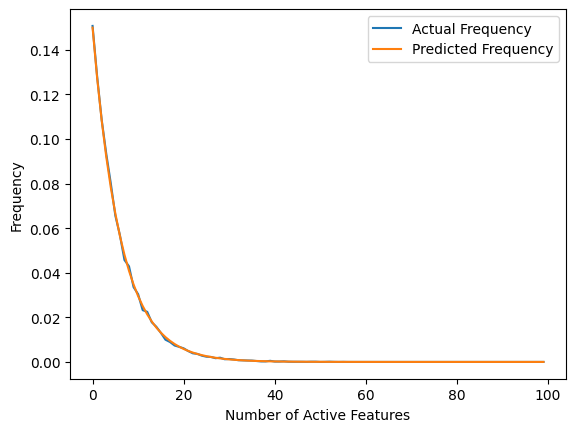

In [364]:
plt.plot(actual_freq, label='Actual Frequency')
plt.plot(predicted_freq, label='Predicted Frequency')
plt.xlabel('Number of Active Features')
plt.ylabel('Frequency')
plt.legend()

In [365]:
zero_angle = get_angle(0, 10)
print(f"Zero angle: {zero_angle:.2f} rad")
one_angle = get_angle(1, 10)
print(f"One angle: {one_angle:.2f} rad")

Zero angle: 1.26 rad
One angle: 0.00 rad


In [366]:
def linear_lr(step, steps):
    return (1 - (step / steps))

def constant_lr(*_):
    return 1.0

def cosine_decay_lr(step, steps):
    return np.cos(0.5 * np.pi * step / (steps - 1))


@dataclass
class Config:
    # We optimize n_instances models in a single training loop to let us sweep over
    # sparsity or importance curves  efficiently. You should treat `n_instances` as
    # kinda like a batch dimension, but one which is built into our training setup.
    n_instances: int
    n_features: int = 5
    n_hidden: int = 2
    n_correlated_pairs: int = 0
    n_anticorrelated_pairs: int = 0


class Model(nn.Module):
    W: Float[Tensor, "n_instances n_hidden n_features"]
    b_final: Float[Tensor, "n_instances n_features"]
    # Our linear map is x -> ReLU(W.T @ W @ x + b_final)

    def __init__(
        self,
        cfg: Config,
        feature_probability: Optional[Union[float, Tensor]] = None,
        importance: Optional[Union[float, Tensor]] = None,
        device = device,
        groupings: Optional[Dict] = None,
    ):
        super().__init__()
        self.cfg = cfg
        self.groupings = groupings

        self.accuracy_matrix = t.diag(t.ones(cfg.n_features)).to(device)
        if groupings is not None:
            for group_dict in groupings:
                grou_members = group_dict['members']
                semantic_distance = group_dict['semantic_distance']
                n_group = len(grou_members)
                angle = get_angle(semantic_distance, n_group)
                print(f"Group members: {grou_members}, angle: {angle:.2f}")
                for i in grou_members:
                    for j in grou_members:
                        if i == j:
                            self.accuracy_matrix[i, j] = np.cos(angle)
                        else:
                            self.accuracy_matrix[i, j] = np.sin(angle)/n_group
        if feature_probability is None: feature_probability = t.ones(())
        if isinstance(feature_probability, float): feature_probability = t.tensor(feature_probability)
        self.feature_probability = feature_probability.to(device).broadcast_to((cfg.n_instances, cfg.n_features))
        if importance is None: importance = t.ones(())
        if isinstance(importance, float): importance = t.tensor(importance)
        self.importance = importance.to(device).broadcast_to((cfg.n_instances, cfg.n_features))
        self.W = nn.Parameter(nn.init.xavier_normal_(t.empty((cfg.n_instances, cfg.n_hidden, cfg.n_features))))
        self.b_final = nn.Parameter(t.zeros((cfg.n_instances, cfg.n_features)))
        self.to(device)




    def forward(
        self,
        features: Float[Tensor, "... instances features"]
    ) -> Float[Tensor, "... instances features"]:

        hidden_layer = t.einsum("...if,ihf->...ih", features, self.W)
        return F.relu(t.einsum("...ih,ihf->...if", hidden_layer, self.W) + self.b_final)


    def generate_batch(self, batch_size) -> Float[Tensor, "batch_size instances features"]:
        '''
        Generates a batch of data. We'll return to this function later when we apply correlations.
        '''
        # Generate the features, before randomly setting some to zero
        feat = t.rand((batch_size, self.cfg.n_instances, self.cfg.n_features), device=self.W.device)
        # Generate a random boolean array, which is 1 wherever we'll keep a feature, and zero where we'll set it to zero
        feat_seeds = t.rand((batch_size, self.cfg.n_instances, self.cfg.n_features), device=self.W.device)
        feat_is_present = feat_seeds <= self.feature_probability
        # Create our batch from the features, where we set some to zero

        if self.groupings is not None:
            for group_dict in self.groupings:
                group_members = group_dict['members']
                group_p_transfer = group_dict['p_transfer']

                lst = t.tensor(group_members)
                
                feat_is_present[:, :, lst] = generate_feature_mask_group(feat_is_present[:, :, lst], group_p_transfer)

        batch = t.where(feat_is_present, feat, 0.0)
        return batch


    def calculate_loss(
        self,
        out: Float[Tensor, "batch instances features"],
        batch: Float[Tensor, "batch instances features"],
    ) -> Float[Tensor, ""]:
        '''
        Calculates the loss for a given batch, using this loss described in the Toy Models paper:

            https://transformer-circuits.pub/2022/toy_model/index.html#demonstrating-setup-loss

        Remember, `model.importance` will always have shape (n_instances, n_features).
        '''

        diff = out - batch
        rotated_diff = t.einsum("bin,fn->bif", diff, self.accuracy_matrix)
        total_diff = (rotated_diff ** 2 * self.importance).sum(dim = -1)
        return total_diff.mean()
    


    def optimize(
        self,
        batch_size: int = 1024,
        steps: int = 10_000,
        log_freq: int = 100,
        lr: float = 1e-3,
        lr_scale: Callable[[int, int], float] = constant_lr,
    ):
        '''
        Optimizes the model using the given hyperparameters.
        '''
        optimizer = t.optim.Adam(list(self.parameters()), lr=lr)

        progress_bar = tqdm(range(steps))

        for step in progress_bar:

            # Update learning rate
            step_lr = lr * lr_scale(step, steps)
            for group in optimizer.param_groups:
                group['lr'] = step_lr

            # Optimize
            optimizer.zero_grad()
            batch = self.generate_batch(batch_size)
            out = self(batch)
            loss = self.calculate_loss(out, batch)
            loss.backward()
            optimizer.step()

            # Display progress bar
            if step % log_freq == 0 or (step + 1 == steps):
                progress_bar.set_postfix(loss=loss.item()/self.cfg.n_instances, lr=step_lr)

In [375]:
cfg = Config(
    n_instances = 8,
    n_features = 6,
    n_hidden = 2,
)

In [376]:
groupings = [dict(members=[0, 1, 2], semantic_distance=0.1,p_transfer = .9), dict(members=[3, 4, 5], semantic_distance=0.1, p_transfer = .1)]

In [377]:
feature_probability = t.ones(cfg.n_instances)*0.3
feature_probability = feature_probability.unsqueeze(1)

In [378]:
importance = (1.0 ** t.arange(cfg.n_features))
importance = einops.rearrange(importance, "features -> () features")

In [379]:
model = Model(
    cfg = cfg,
    device = device,
    feature_probability = feature_probability,
    importance = importance,
    groupings = groupings,
)
model.accuracy_matrix 

Group members: [0, 1, 2], angle: 0.77
Group members: [3, 4, 5], angle: 0.77


tensor([[0.7181, 0.2320, 0.2320, 0.0000, 0.0000, 0.0000],
        [0.2320, 0.7181, 0.2320, 0.0000, 0.0000, 0.0000],
        [0.2320, 0.2320, 0.7181, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000, 0.7181, 0.2320, 0.2320],
        [0.0000, 0.0000, 0.0000, 0.2320, 0.7181, 0.2320],
        [0.0000, 0.0000, 0.0000, 0.2320, 0.2320, 0.7181]])

  0%|          | 0/10000 [00:00<?, ?it/s]

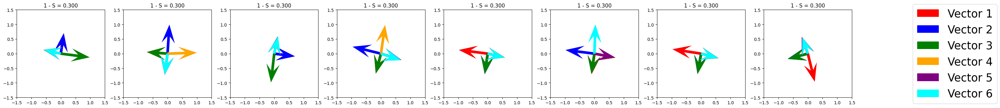

In [380]:

model.optimize(steps=10000)

titles = [f"1 - S = {i:.3f}" for i in feature_probability.squeeze()]
plot_vector_groups(model.W.detach(), group_titles=titles)

In [381]:
for W in model.W.detach():
    W_normed = W / W.norm(dim=0, keepdim=True)
    imshow(W_normed.T @ W_normed, title="Cosine similarities of each pair of 2D feature embeddings", width=600)
    

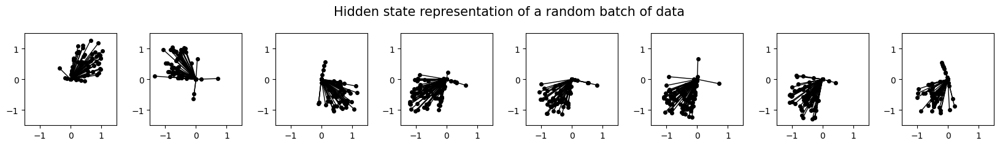

In [382]:
with t.inference_mode():
    batch = model.generate_batch(200)
    hidden = einops.einsum(batch, model.W, "batch_size instances features, instances hidden features -> instances hidden batch_size")

plot_features_in_2d(hidden, title = "Hidden state representation of a random batch of data")

In [383]:
t.cat([t.tensor([1-0.1*(i+1) for i in range(5)])**(j+1) for j in range(10)])

tensor([0.9000, 0.8000, 0.7000, 0.6000, 0.5000, 0.8100, 0.6400, 0.4900, 0.3600,
        0.2500, 0.7290, 0.5120, 0.3430, 0.2160, 0.1250, 0.6561, 0.4096, 0.2401,
        0.1296, 0.0625, 0.5905, 0.3277, 0.1681, 0.0778, 0.0312, 0.5314, 0.2621,
        0.1176, 0.0467, 0.0156, 0.4783, 0.2097, 0.0824, 0.0280, 0.0078, 0.4305,
        0.1678, 0.0576, 0.0168, 0.0039, 0.3874, 0.1342, 0.0404, 0.0101, 0.0020,
        0.3487, 0.1074, 0.0282, 0.0060, 0.0010])

In [405]:
n_features = 80
n_hidden = 20

inner_goup_distance = 1.
group_size = 5
p_transfer = 0.9
groupings = [dict(members=list(range(i, i+group_size)), semantic_distance=inner_goup_distance, p_transfer = p_transfer) for i in range(0, n_features, group_size)]

importance = (1.0 ** t.arange(n_features))
#importance = t.cat([t.tensor([1-0.1*(i+1)/2 for i in range(group_size)])**(j+1) for j in  range(0, n_features, group_size)])
importance = einops.rearrange(importance, "features -> () features")

feature_probability = t.tensor([0.6,0.5,0.4,0.3,0.2])
n_instances = 8
#feature_probability = t.ones(n_instances)*0.001
feature_probability = einops.rearrange(feature_probability, "instances -> instances ()")

cfg = Config(
    n_instances = len(feature_probability.squeeze()),
    n_features = n_features,
    n_hidden = n_hidden,
)

line(importance.squeeze(), width=600, height=400, title="Importance of each feature (same over all instances)", labels={"y": "Feature importance", "x": "Feature"})
line(feature_probability.squeeze(), width=600, height=400, title="Feature probability (varied over instances)", labels={"y": "Probability", "x": "Instance"})

model = Model(
    cfg = cfg,
    device = device,
    importance = importance,
    feature_probability = feature_probability,
    groupings = groupings,
)
model.optimize(steps=10_000)

Group members: [0, 1, 2, 3, 4], angle: 0.00
Group members: [5, 6, 7, 8, 9], angle: 0.00
Group members: [10, 11, 12, 13, 14], angle: 0.00
Group members: [15, 16, 17, 18, 19], angle: 0.00
Group members: [20, 21, 22, 23, 24], angle: 0.00
Group members: [25, 26, 27, 28, 29], angle: 0.00
Group members: [30, 31, 32, 33, 34], angle: 0.00
Group members: [35, 36, 37, 38, 39], angle: 0.00
Group members: [40, 41, 42, 43, 44], angle: 0.00
Group members: [45, 46, 47, 48, 49], angle: 0.00
Group members: [50, 51, 52, 53, 54], angle: 0.00
Group members: [55, 56, 57, 58, 59], angle: 0.00
Group members: [60, 61, 62, 63, 64], angle: 0.00
Group members: [65, 66, 67, 68, 69], angle: 0.00
Group members: [70, 71, 72, 73, 74], angle: 0.00
Group members: [75, 76, 77, 78, 79], angle: 0.00


  0%|          | 0/10000 [00:00<?, ?it/s]

In [406]:
plot_features_in_Nd(
    model.W,
    height = 600,
    width = 1400,
    title = "ReLU output model: n_features = 80, d_hidden = 20, I<sub>i</sub> = 0.9<sup>i</sup>",
    subplot_titles = [f"Feature prob = {i:.3f}" for i in feature_probability[:, 0]],
)

In [392]:
plot_features_in_Nd(
    model.W,
    height = 600,
    width = 1400,
    title = "ReLU output model: n_features = 80, d_hidden = 20, I<sub>i</sub> = 0.9<sup>i</sup>",
    subplot_titles = [f"Feature prob = {i:.3f}" for i in feature_probability[:, 0]],
)